In [2]:
import os
import sys

import time
import itertools
import numpy as np
import torch
from matplotlib.pylab import plt
import gc

lib_svraster = "/home/dotamthuc/Works/Projects/Compress3DGS/svraster"
sys.path.insert(0, lib_svraster)

lib_compress= "/home/dotamthuc/Works/Projects/Compress3DGS/Differentiable3DPC-Decompression-and-Rendering"
sys.path.insert(0, lib_compress)

np.set_printoptions(precision=6, suppress=True, linewidth=np.inf, threshold=np.inf)


from src.config import cfg, update_argparser, update_config
from src.dataloader.data_pack import DataPack
from src.sparse_voxel_model import SparseVoxelModel
from src.utils.image_utils import im_tensor2np, viz_tensordepth

from libs.raht import raht
import constriction
from sklearn.cluster import KMeans


import numpy as np
from src.utils import octree_utils
import svraster_cuda

def im_tensor2np(x):
    if x.shape[0] == 1:
        x = x.squeeze(0)
    if len(x.shape) == 3:
        x = x.moveaxis(0, -1)
    return x.clamp(0, 1).mul(255).cpu().numpy().astype(np.uint8)


# 00 - Script

In [3]:
import numpy as np
from collections import deque

# ------------------------------------------------------------------
# Path table (unchanged)
# ------------------------------------------------------------------
def morton_to_path(keys, max_level):
    """keys : (L,) uint64  →  path : (L, max_level) uint8"""
    keys = np.asarray(keys, dtype=np.uint64)
    L = len(keys)
    path = np.empty((L, max_level), dtype=np.uint8)
    for d in range(max_level):
        shift = 3 * (max_level - 1 - d)
        path[:, d] = (keys >> shift) & 7
    return path

# ------------------------------------------------------------------
# Encode – sequential BFS + np.diff for run boundaries
# ------------------------------------------------------------------
def encode_from_path(path, depths, max_level):
    """
    path   : (L, max_level) uint8
    depths : (L,) int          terminal depth of each point
    Returns a compact stream of uint8:
        0          → leaf (terminal flag)
        1..255     → occupancy mask of an internal node
    """
    path   = np.asarray(path,   dtype=np.uint8)
    depths = np.asarray(depths, dtype=np.int32)
    L = path.shape[0]

    stream = []
    # queue stores (start, end, depth) – integer ranges into the sorted array
    q = deque([(0, L, 0)])

    while q:
        start, end, depth = q.popleft()
        if start >= end:
            continue

        # ---------- terminal flag ----------
        if np.all(depths[start:end] == depth):
            stream.append(0)
            continue

        # ---------- internal node ----------
        children = path[start:end, depth]          # view of child indices

        # locate every place where the child index changes
        # np.diff == 0 → same child, != 0 → new run starts
        changes = np.flatnonzero(np.diff(children)) + 1
        # boundaries of the runs: [0, change1, change2, ..., length]
        bounds  = np.concatenate(([0], changes, [end - start]))

        mask = 0
        for a, b in zip(bounds[:-1], bounds[1:]):
            c = int(children[a])                   # child index of this run
            mask |= (1 << c)
            # push the corresponding sub-range
            q.append((start + a, start + b, depth + 1))

        stream.append(mask)

    return np.asarray(stream, dtype=np.uint8)

# ------------------------------------------------------------------
# Decode (unchanged – reconstructs keys purely from the stream)
# ------------------------------------------------------------------
def decode_from_stream(stream, max_level):
    stream = np.asarray(stream, dtype=np.uint8)
    leaf_keys, leaf_depths = [], []
    q = deque([(np.int64(0), 0)])
    idx = 0

    while q and idx < len(stream):
        prefix, depth = q.popleft()
        mask = int(stream[idx])
        idx += 1

        if mask == 0:                               # terminal flag
            key = prefix << (3 * (max_level - depth))
            leaf_keys.append(key)
            leaf_depths.append(depth)
            continue

        for c in range(8):
            if mask & (1 << c):
                q.append(((prefix << 3) | np.int64(c), depth + 1))

    codes = np.asarray(leaf_keys,   dtype=np.int64)
    depths = np.asarray(leaf_depths, dtype=np.int32)

    order = np.argsort(codes)
    codes = codes[order]
    depths = depths[order]

    return (codes, depths)

# ------------------------------------------------------------------
# Convenience wrappers
# ------------------------------------------------------------------
def encode_morton(keys, depths, max_level, sorted=True):
    if not sorted:
        # make sure sorted
        order  = np.argsort(keys)
        keys   = keys[order]
        depths = depths[order]
        
    path = morton_to_path(keys, max_level)
    return encode_from_path(path, depths, max_level)

# 01 - test

In [4]:

root_path=f"/home/dotamthuc/Works/Projects/Compress3DGS/Experiments"
path_dataset=f"f{root_path}/data/mip-nerf-360"
path_output_base=f"{root_path}/output/SVRaster/mip-nerf-360"
scene_list = [
    "bicycle",
    "bonsai",
    "counter",
    "flowers",
    "garden",
    "kitchen",
    "room",
    "stump",
    "treehill",
]
scene = "stump"

path_source=f"{path_dataset}/{scene}"
path_output=f"{path_output_base}/{scene}"

In [5]:
import argparse
parser = argparse.ArgumentParser(
    description="Sparse voxels raster rendering.")
parser.add_argument('model_path')
args = parser.parse_args(args=[f"{path_output}"])
update_config(os.path.join(args.model_path, 'config.yaml'))


In [6]:
# Load data
data_pack = DataPack(
    source_path=cfg.data.source_path,
    image_dir_name=cfg.data.image_dir_name,
    res_downscale=cfg.data.res_downscale,
    res_width=cfg.data.res_width,
    skip_blend_alpha=cfg.data.skip_blend_alpha,
    alpha_is_white=cfg.model.white_background,
    data_device=cfg.data.data_device,
    use_test=cfg.data.eval,
    test_every=cfg.data.test_every,
    camera_params_only=False,
)

# Load model
voxel_model = SparseVoxelModel(
    n_samp_per_vox=cfg.model.n_samp_per_vox,
    sh_degree=cfg.model.sh_degree,
    ss=cfg.model.ss,
    white_background=cfg.model.white_background,
    black_background=cfg.model.black_background,
)

# loaded_iter = voxel_model.load_iteration(args.model_path, -1)
# voxel_model.freeze_vox_geo()

Read dataset in COLMAP format.
Read dataset in 6.076 seconds.


In [7]:
model_checkpoint_path = os.path.join(args.model_path, "checkpoints", f"iter030000_model.pt")
state_dict = torch.load(model_checkpoint_path, map_location="cpu", weights_only=False)

In [8]:
model_checkpoint_path = os.path.join(args.model_path, "checkpoints", f"iter030000_model.pt")
state_dict = torch.load(model_checkpoint_path, map_location="cpu", weights_only=False)

active_sh_degree = state_dict['active_sh_degree']
scene_center     = state_dict['scene_center'].numpy()
inside_extent    = state_dict['inside_extent'].numpy()
scene_extent     = state_dict['scene_extent'].numpy()


octpath = state_dict['octpath'].numpy()
octlevel = state_dict['octlevel'].numpy()

geo_grid_pts = state_dict['_geo_grid_pts'].numpy()
sh0 = state_dict['_sh0'].numpy()
shs = state_dict['_shs'].numpy()


order = np.argsort(octpath[:, 0])
octpath = octpath[order]
octlevel = octlevel[order]
sh0 = sh0[order]
shs = shs[order]


In [9]:

# Load model
voxel_model = SparseVoxelModel(
    n_samp_per_vox=cfg.model.n_samp_per_vox,
    sh_degree=cfg.model.sh_degree,
    ss=cfg.model.ss,
    white_background=cfg.model.white_background,
    black_background=cfg.model.black_background,
)


voxel_model.active_sh_degree = active_sh_degree
voxel_model.scene_center     = torch.tensor(scene_center).cuda().to(torch.float32)
voxel_model.inside_extent    = torch.tensor(inside_extent).cuda().to(torch.float32)
voxel_model.scene_extent     = torch.tensor(scene_extent).cuda().to(torch.float32)

voxel_model.octpath  = torch.tensor(octpath).cuda().to(torch.int64)
voxel_model.octlevel = torch.tensor(octlevel).cuda().to(torch.int8)

voxel_model._geo_grid_pts = torch.tensor(geo_grid_pts).cuda().to(torch.float32)
voxel_model._sh0          = torch.tensor(sh0).cuda().to(torch.float32)
voxel_model._shs          = torch.tensor(shs).cuda().to(torch.float32)


tr_render_opt = {
    'track_max_w': False,
    'output_depth': False,
    'output_normal': False,
    'output_T': False,
}
psnr_lst = []
views = data_pack.get_test_cameras()
for idx, view in enumerate(views):
    render_pkg = voxel_model.render(view, **tr_render_opt)
    rendering = render_pkg['color']
    gt = view.image.cuda()
    mse = (rendering.clip(0,1) - gt.clip(0,1)).square().mean()
    psnr = -10 * torch.log10(mse)
    psnr_lst.append(psnr.item())
print('PSNR:', np.mean(psnr_lst))

PSNR: 26.38827073574066


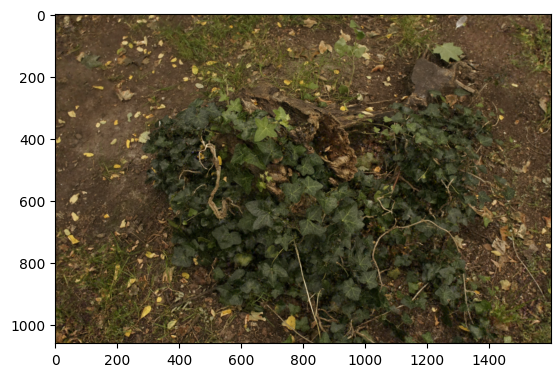

In [10]:
plt.imshow(im_tensor2np(rendering.detach()))

## 01 - Test occupacy coding

In [11]:
bitstreams = encode_morton(octpath[:, 0], octlevel[:, 0], max_level=16)


In [12]:
decoded_octpath, decoded_octlevel = decode_from_stream(bitstreams, max_level=16)


In [13]:
np.all(decoded_octpath == octpath[:, 0]), np.all(decoded_octlevel == octlevel[:, 0]), 

(True, True)

In [16]:

# Load model
voxel_model = SparseVoxelModel(
    n_samp_per_vox=cfg.model.n_samp_per_vox,
    sh_degree=cfg.model.sh_degree,
    ss=cfg.model.ss,
    white_background=cfg.model.white_background,
    black_background=cfg.model.black_background,
)


voxel_model.active_sh_degree = active_sh_degree
voxel_model.scene_center     = torch.tensor(scene_center).cuda().to(torch.float32)
voxel_model.inside_extent    = torch.tensor(inside_extent).cuda().to(torch.float32)
voxel_model.scene_extent     = torch.tensor(scene_extent).cuda().to(torch.float32)

voxel_model.octpath  = torch.tensor(decoded_octpath[:, np.newaxis], dtype=torch.int64).cuda()
voxel_model.octlevel = torch.tensor(decoded_octlevel[:, np.newaxis], dtype=torch.int8).cuda()

voxel_model._geo_grid_pts = torch.tensor(geo_grid_pts).cuda().to(torch.float32)
voxel_model._sh0          = torch.tensor(sh0).cuda().to(torch.float32)
voxel_model._shs          = torch.tensor(shs).cuda().to(torch.float32)


tr_render_opt = {
    'track_max_w': False,
    'output_depth': False,
    'output_normal': False,
    'output_T': False,
}
psnr_lst = []
views = data_pack.get_test_cameras()
for idx, view in enumerate(views):
    render_pkg = voxel_model.render(view, **tr_render_opt)
    rendering = render_pkg['color']
    gt = view.image.cuda()
    mse = (rendering.clip(0,1) - gt.clip(0,1)).square().mean()
    psnr = -10 * torch.log10(mse)
    psnr_lst.append(psnr.item())
print('PSNR:', np.mean(psnr_lst))

PSNR: 26.38827073574066


In [17]:
np.savez_compressed("Temp/occupacy_bitstreams.npz", bitstreams=bitstreams)


In [18]:
meta_infos = {
    "active_sh_degree": active_sh_degree,
    "scene_center": scene_center,
    "inside_extent": inside_extent,
    "scene_extent": scene_extent,
}

np.savez_compressed("Temp/meta_infos.npz", **meta_infos)


## 02 - Test Geo param coding

In [ ]:
import numpy as np
from src.utils import octree_utils
import svraster_cuda

def exp_linear_11(geo_x):
    output = np.where(
        geo_x > 1.1,
        geo_x,
        np.exp(0.909090909091 * geo_x - 0.904689820196)
    )
    return output

def exp_linear_11_inverse(geo_y):
    geo_y[geo_y<=0] = 1e-10

    output = np.where(
        geo_y > 1.1,
        geo_y,
        ( np.log(geo_y) + 0.904689820196 ) / 0.909090909091
    )
    return output


In [19]:
meta_infos = np.load("Temp/meta_infos.npz")
active_sh_degree = meta_infos["active_sh_degree"]
scene_center = torch.tensor(meta_infos["scene_center"]).cuda()
inside_extent = torch.tensor(meta_infos["inside_extent"]).cuda()
scene_extent = torch.tensor(meta_infos["scene_extent"]).cuda()

In [61]:
bitstreams = np.load("Temp/occupacy_bitstreams.npz")["bitstreams"]
decoded_octpath, decoded_octlevel = decode_from_stream(bitstreams, max_level=16)
decoded_octpath = torch.tensor(decoded_octpath[:, np.newaxis], dtype=torch.int64).cuda()
decoded_octlevel = torch.tensor(decoded_octlevel[:, np.newaxis], dtype=torch.int8).cuda()


In [62]:

# Load model
voxel_model = SparseVoxelModel(
    n_samp_per_vox=cfg.model.n_samp_per_vox,
    sh_degree=cfg.model.sh_degree,
    ss=cfg.model.ss,
    white_background=cfg.model.white_background,
    black_background=cfg.model.black_background,
)


voxel_model.active_sh_degree = active_sh_degree
voxel_model.scene_center     = scene_center
voxel_model.inside_extent    = inside_extent
voxel_model.scene_extent     = scene_extent

voxel_model.octpath  = decoded_octpath
voxel_model.octlevel = decoded_octlevel

voxel_model._geo_grid_pts = torch.tensor(geo_grid_pts).cuda().to(torch.float32)
voxel_model._sh0          = torch.tensor(sh0).cuda().to(torch.float32)
voxel_model._shs          = torch.tensor(shs).cuda().to(torch.float32)


tr_render_opt = {
    'track_max_w': False,
    'output_depth': False,
    'output_normal': False,
    'output_T': False,
}
psnr_lst = []
views = data_pack.get_test_cameras()
for idx, view in enumerate(views):
    render_pkg = voxel_model.render(view, **tr_render_opt)
    rendering = render_pkg['color']
    gt = view.image.cuda()
    mse = (rendering.clip(0,1) - gt.clip(0,1)).square().mean()
    psnr = -10 * torch.log10(mse)
    psnr_lst.append(psnr.item())
print('PSNR:', np.mean(psnr_lst))

PSNR: 26.38827073574066


In [43]:
vox_center, vox_size = octree_utils.octpath_decoding(
    decoded_octpath,
    decoded_octlevel,
    scene_center,
    scene_extent
)
grid_pts_key, vox_key = octree_utils.build_grid_pts_link(
    decoded_octpath, 
    decoded_octlevel
)

max_levels = torch.ones((grid_pts_key.shape[0], 1), dtype=torch.int8)*16
spanned_mortoncode = svraster_cuda.utils.ijk_2_octpath(grid_pts_key, max_levels)
spanned_mortoncode = spanned_mortoncode[:, 0].cpu().numpy()
num_corners = spanned_mortoncode.shape[0]

In [83]:
subtree_shift_int64 = torch.tensor([
    [0, 0, 0], [0, 0, 1], [0, 1, 0], [0, 1, 1],
    [1, 0, 0], [1, 0, 1], [1, 1, 0], [1, 1, 1],
], dtype=torch.int64, device="cuda")
subtree_shift = subtree_shift_int64.float()

vox_ijk = svraster_cuda.utils.octpath_2_ijk(decoded_octpath, decoded_octlevel)
lv2max = (16 - decoded_octlevel).long()
base_grid_ijk = (vox_ijk << lv2max).view(-1, 1, 3)
gridpts = base_grid_ijk + (subtree_shift_int64 << lv2max.view(-1, 1, 1))
grid_pts_key, vox_key = gridpts.reshape(-1, 3).unique(dim=0, return_inverse=True)

max_levels = torch.ones((grid_pts_key.shape[0], 1), dtype=torch.int8)*16
spanned_mortoncode = svraster_cuda.utils.ijk_2_octpath(grid_pts_key, max_levels)
spanned_mortoncode = spanned_mortoncode[:, 0].cpu().numpy()
num_corners = spanned_mortoncode.shape[0]

In [84]:

index2corners = np.arange(spanned_mortoncode.shape[0]).astype(np.int32)
cornersorder  = np.argsort(spanned_mortoncode)
index2corners      = index2corners[cornersorder]
spanned_mortoncode = spanned_mortoncode[cornersorder]
grid_pts_key_sorted = grid_pts_key[cornersorder]

some_wrongs = np.where(spanned_mortoncode[:-1] >= spanned_mortoncode[1:])[0]
some_wrongs

array([42549, 64957])

In [85]:
morton_to_path(spanned_mortoncode[42548:42551], 16)

array([[0, 3, 2, 0, 1, 1, 7, 6, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 3, 2, 0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 3, 2, 0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=uint8)

In [95]:
(grid_pts_key_sorted[64956:64957+3])

tensor([[65536, 24576, 25344],
        [    0, 24576, 25600],
        [65536, 24576, 25600],
        [    0, 24576, 25728]], device='cuda:0')

In [97]:
2**16-1

65535

In [87]:
index2corners[42548:42551]

array([    6737, 18464341,      276], dtype=int32)

In [93]:
vox_key = vox_key.reshape(-1, 8).contiguous()
np.where(vox_key.cpu().numpy() == 18464341)

(array([4424378]), array([7]))

In [89]:
vox_key[17165]

tensor([ 268,  269,  276,  277, 1693, 1694, 1701, 1702], device='cuda:0')

In [90]:
grid_pts_key[vox_key[17165]]

tensor([[    0, 25344, 18432],
        [    0, 25344, 18688],
        [    0, 25600, 18432],
        [    0, 25600, 18688],
        [  256, 25344, 18432],
        [  256, 25344, 18688],
        [  256, 25600, 18432],
        [  256, 25600, 18688]], device='cuda:0')

In [92]:
base_grid_ijk[17165]

tensor([[    0, 25344, 18432]], device='cuda:0')

In [94]:
2**16

65536

In [ ]:
spanned_mortoncode = spanned_mortoncode[:, 0].cpu().numpy()
attributes = geo_grid_pts

index2origin  = np.arange(spanned_mortoncode.shape[0]).astype(np.int32)
corners_order = np.argsort(spanned_mortoncode)

index2origin       = index2origin[corners_order]
spanned_mortoncode = spanned_mortoncode[corners_order]
attributes         = attributes[corners_order]

In [ ]:

binlevel, coeff_binlevel = raht.RahtPrologue(spanned_mortoncode)
order_coefs = np.argsort(coeff_binlevel)
index_reverse = np.arange(coeff_binlevel.shape[0]).astype(np.int32)
index_reverse = index_reverse[order_coefs]

In [ ]:
transformed_attributes = raht.Raht(binlevel, attributes)

In [ ]:
stepsize = 0.5
quantized_transformed_attributes = np.round(
    transformed_attributes / stepsize
).astype(np.int32)

quantized_transformed_attributes = quantized_transformed_attributes[order_coefs]
DC_coef = quantized_transformed_attributes[:1]


In [ ]:
np.min(quantized_transformed_attributes[1:]), np.max(quantized_transformed_attributes[1:])

(-1897, 6955)

In [ ]:
AC_coefs = quantized_transformed_attributes[1:, 0].astype(np.int32)

entropy_model = constriction.stream.model.QuantizedLaplace(-10000, 10000, 0, 5)

# ---------- Encoding ----------
encoder = constriction.stream.stack.AnsCoder()
encoder.encode_reverse(AC_coefs, entropy_model)

compressed = encoder.get_compressed()
print(f"Compressed size: {encoder.num_valid_bits()/1024/1024/8} Mb "
      f"({len(compressed) * 32/1024/1024/8} Mb including padding)")

decoder = constriction.stream.stack.AnsCoder(compressed)
decoded_AC_coefs = decoder.decode(entropy_model, len(AC_coefs))  # decode exactly N symbols

# print("Original :", message)
# print("Decoded  :", decoded)
assert np.all(decoded_AC_coefs == AC_coefs)
print("Round-trip successful!")

Compressed size: 11.880248785018921 Mb (11.8802490234375 Mb including padding)
Round-trip successful!


In [ ]:
DC_coef

array([[-23465]], dtype=int32)

In [ ]:
np.savez_compressed("Temp/geoparams_bitstreams.npz", DC_coef=DC_coef, geoparams_bitstreams=compressed)

In [ ]:
decoded_transformed_attributes = np.concatenate([DC_coef, decoded_AC_coefs[:, np.newaxis]])

decoded_temp = np.zeros_like(decoded_transformed_attributes)
decoded_temp[index_reverse] = decoded_transformed_attributes * stepsize
decoded_attributes_ordered = raht.InvRaht(binlevel, decoded_temp)

decoded_attributes = np.zeros_like(decoded_attributes_ordered)
decoded_attributes[index2origin] = decoded_attributes_ordered
decoded_geo_grid_params = decoded_attributes

In [ ]:

# Load model
voxel_model = SparseVoxelModel(
    n_samp_per_vox=cfg.model.n_samp_per_vox,
    sh_degree=cfg.model.sh_degree,
    ss=cfg.model.ss,
    white_background=cfg.model.white_background,
    black_background=cfg.model.black_background,
)


voxel_model.active_sh_degree = active_sh_degree
voxel_model.scene_center     = scene_center
voxel_model.inside_extent    = inside_extent
voxel_model.scene_extent     = scene_extent

voxel_model.octpath  = decoded_octpath
voxel_model.octlevel = decoded_octlevel

voxel_model._geo_grid_pts = torch.tensor(decoded_geo_grid_params).cuda().to(torch.float32)
voxel_model._sh0          = torch.tensor(sh0).cuda().to(torch.float32)
voxel_model._shs          = torch.tensor(shs).cuda().to(torch.float32)


tr_render_opt = {
    'track_max_w': False,
    'output_depth': False,
    'output_normal': False,
    'output_T': False,
}
psnr_lst = []
views = data_pack.get_test_cameras()
for idx, view in enumerate(views):
    render_pkg = voxel_model.render(view, **tr_render_opt)
    rendering = render_pkg['color']
    gt = view.image.cuda()
    mse = (rendering.clip(0,1) - gt.clip(0,1)).square().mean()
    psnr = -10 * torch.log10(mse)
    psnr_lst.append(psnr.item())
print('PSNR:', np.mean(psnr_lst))

PSNR: 25.24235893249512


In [ ]:
view = views[0]

In [ ]:
cam_pos = view.position

In [ ]:
camera_centers = np.array([
    v.position.cpu().numpy() for v in data_pack.get_test_cameras()
])
vox_xyz = vox_center.cpu().numpy()

In [ ]:
print("camera_centers:", camera_centers.shape)

list_dir = []
for view_i, cam_center in enumerate(camera_centers):
    print(f"Extract View directions {view_i}")
    All_direction = (vox_xyz - cam_center[np.newaxis, :])
    All_direction = All_direction / (All_direction**2).sum(axis=1, keepdims=True)
    kmeans = KMeans(n_clusters=128, random_state=0, n_init='auto')
    kmeans.fit(All_direction)
    list_dir.append(kmeans.cluster_centers_)


camera_centers: (25, 3)
Extract View directions 0
Extract View directions 1
Extract View directions 2
Extract View directions 3
Extract View directions 4
Extract View directions 5
Extract View directions 6
Extract View directions 7
Extract View directions 8
Extract View directions 9
Extract View directions 10
Extract View directions 11
Extract View directions 12
Extract View directions 13
Extract View directions 14
Extract View directions 15
Extract View directions 16
Extract View directions 17
Extract View directions 18
Extract View directions 19
Extract View directions 20
Extract View directions 21
Extract View directions 22
Extract View directions 23
Extract View directions 24


In [ ]:
list_dir = list_dir.reshape(25*128, 3)

In [ ]:
list_dir

array([[ 0.036876, -0.028713,  0.05799 ],
       [ 0.239998,  0.048371,  0.251069],
       [ 0.184482,  0.002288,  0.109934],
       [ 0.007749,  0.001856, -0.032284],
       [ 0.459913,  0.435688, -0.176171],
       [-0.424378,  0.24631 ,  0.330227],
       [-0.080564, -0.066924, -0.04578 ],
       [ 0.161547,  0.001097,  0.182911],
       [ 0.092144,  0.055013,  0.39667 ],
       [ 0.108296, -0.030431,  0.018264],
       [-0.053171,  0.363726, -0.392432],
       [ 0.313923,  1.022766,  0.14047 ],
       [-0.062978, -0.044817,  0.047499],
       [ 0.093229, -0.085298, -0.014569],
       [ 0.383007,  0.135459,  0.065437],
       [ 0.362173,  0.172906,  0.345522],
       [ 0.203673,  0.117447, -0.169967],
       [-0.035174,  0.02167 , -0.08735 ],
       [ 0.017282,  0.139856,  0.521933],
       [ 0.247821,  0.033207,  0.116064],
       [-0.254585,  0.793469,  0.539066],
       [ 0.035958, -0.010981,  0.212503],
       [ 0.05568 , -0.028972, -0.046999],
       [-0.076975, -0.011459,  0.1

In [ ]:

# list_dir = np.concatenate(list_dir)
transformM = []
i=0
for dir in list_dir:
    out_dir = []
    for c_i in range(16):
        out_c_i = []
        for k in range(3):
            coefs = np.zeros((16, 3))
            coefs[c_i, k] = 1.0
            out_c_i.append(computeSHbasis(np.array(dir), coefs))
        out_dir.append(out_c_i)
    transformM.append(out_dir)
transformM = np.array(transformM)
transformM = np.transpose(transformM, (0, 3, 1, 2)).reshape(len(list_dir)*3, 16, 3)
print(f"transformM.shape={transformM.shape}")

transformM.shape=(9600, 16, 3)


In [ ]:
transformM

array([[[ 0.282095,  0.      ,  0.      ],
        [ 0.188368,  0.      ,  0.      ],
        [ 0.380429,  0.      ,  0.      ],
        [-0.241917,  0.      ,  0.      ],
        [-0.208546,  0.      ,  0.      ],
        [ 0.327951,  0.      ,  0.      ],
        [ 0.258206,  0.      ,  0.      ],
        [-0.421182,  0.      ,  0.      ],
        [ 0.052724,  0.      ,  0.      ],
        [ 0.133484,  0.      ,  0.      ],
        [-0.429604,  0.      ,  0.      ],
        [ 0.35789 ,  0.      ,  0.      ],
        [ 0.009048,  0.      ,  0.      ],
        [-0.459632,  0.      ,  0.      ],
        [ 0.108612,  0.      ,  0.      ],
        [ 0.058645,  0.      ,  0.      ]],

       [[ 0.      ,  0.282095,  0.      ],
        [ 0.      ,  0.188368,  0.      ],
        [ 0.      ,  0.380429,  0.      ],
        [ 0.      , -0.241917,  0.      ],
        [ 0.      , -0.208546,  0.      ],
        [ 0.      ,  0.327951,  0.      ],
        [ 0.      ,  0.258206,  0.      ],
        [

In [ ]:

# def getCamsCenter(viewR, viewt):
#     Rt = np.zeros((4, 4))
#     Rt[:3, :3] = viewR.transpose()
#     Rt[:3, 3] = viewt
#     Rt[3, 3] = 1.0

#     C2W = np.linalg.inv(Rt)
#     cam_center = C2W[:3, 3]
#     return cam_center


# def calculateColorTransform():
#     print("")
#     print("Scene Infomation:")
#     print(f"gaussians._xyz.shape={gaussians._xyz.shape}, gaussians.active_sh_degree={gaussians.active_sh_degree}")

#     camera_centers = np.array([
#         getCamsCenter(v.R, v.T) for v in scene.getTrainCameras() + scene.getTestCameras()
#     ])

#     point_cloud_xyz = gaussians._xyz.detach().cpu().numpy()


#     print("camera_centers:", camera_centers.shape)

#     list_dir = []
#     for view_i, cam_center in enumerate(camera_centers):
#         print(f"Extract View directions {view_i}")
#         All_direction = (point_cloud_xyz - cam_center[np.newaxis, :])
#         All_direction = All_direction / (All_direction**2).sum(axis=1, keepdims=True)
#         kmeans = KMeans(n_clusters=128, random_state=0, n_init='auto')
#         kmeans.fit(All_direction)
#         list_dir.append(kmeans.cluster_centers_)

#     list_dir = np.concatenate(list_dir)
#     transformM = []
#     i=0
#     for dir in list_dir:
#         out_dir = []
#         for c_i in range(16):
#             out_c_i = []
#             for k in range(3):
#                 coefs = np.zeros((16, 3))
#                 coefs[c_i, k] = 1.0
#                 out_c_i.append(computeSHbasis(np.array(dir), coefs))
#             out_dir.append(out_c_i)
#         transformM.append(out_dir)
#     transformM = np.array(transformM)
#     transformM = np.transpose(transformM, (0, 3, 1, 2)).reshape(len(list_dir)*3, 16*3)
#     print(f"transformM.shape={transformM.shape}")

#     M = transformM[:, :]
#     MtM = (M.T @ M)
#     U, S, Vt = np.linalg.svd(MtM)
#     MtT_sqrt_inv = U @ np.diag(1/np.sqrt(S)) @ Vt

#     transform = (MtM @ MtT_sqrt_inv).astype(np.float32)
#     inv_transform = (MtT_sqrt_inv).astype(np.float32)

#     all_shs_coefs = gaussians.get_features.detach().cpu().numpy()
#     print(f"all_shs_coefs.shape={all_shs_coefs.shape}")

#     X_transformed = all_shs_coefs.reshape(-1, 48) @ transform
#     XtX = X_transformed.T @ X_transformed
#     U, S, V = np.linalg.svd(XtX)
#     transform_variation = U.astype(np.float32)
#     print(f"U.shape={U.shape}, transform.shape={transform.shape}, inv_transform.shape={inv_transform.shape}")
#     return transform_variation, transform, inv_transform


In [ ]:

SH_C0 = 0.28209479177387814
SH_C1 = 0.4886025119029199
SH_C2 = [
    1.0925484305920792,
    -1.0925484305920792,
    0.31539156525252005,
    -1.0925484305920792,
    0.5462742152960396
]
SH_C3 = [
    -0.5900435899266435,
    2.890611442640554,
    -0.4570457994644658,
    0.3731763325901154,
    -0.4570457994644658,
    1.445305721320277,
    -0.5900435899266435
]
def computeSHbasis(
        input_dir, coefs_mask,
    ):

    dir_norm = np.sqrt(np.sum((input_dir**2)))
    # print(f"dir={dir} dir_norm={dir_norm}")
    input_dir = input_dir / dir_norm
    # print(f"Dir={input_dir}")

    sh = coefs_mask[1:, :]
    sh0 = coefs_mask[0, :]

    # DEG 0
    result = SH_C0 * sh0

    #DEG 1
    x,y,z = input_dir[0], input_dir[1], input_dir[2]
    result = result - SH_C1 * y * sh[0] + SH_C1 * z * sh[1] - SH_C1 * x * sh[2]

    #DEG 2
    xx = x * x
    yy = y * y
    zz = z * z
    xy = x * y
    yz = y * z
    xz = x * z
    result = result + \
        SH_C2[0] * xy * sh[3] + \
        SH_C2[1] * yz * sh[4] + \
        SH_C2[2] * (2.0 * zz - xx - yy) * sh[5] + \
        SH_C2[3] * xz * sh[6] + \
        SH_C2[4] * (xx - yy) * sh[7]
    
    # DEG 3
    result = result + \d
        SH_C3[0] * y * (3.0 * xx - yy) * sh[8] + \
        SH_C3[1] * xy * z * sh[9] + \
        SH_C3[2] * y * (4.0 * zz - xx - yy) * sh[10] + \
        SH_C3[3] * z * (2.0 * zz - 3.0 * xx - 3.0 * yy) * sh[11] + \
        SH_C3[4] * x * (4.0 * zz - xx - yy) * sh[12] + \
        SH_C3[5] * z * (xx - yy) * sh[13] + \
        SH_C3[6] * x * (xx - 3.0 * yy) * sh[14] 

    result = result
    # result[result<=0] = 0.0
    return result


# 03 - Test direction extract

In [2]:

root_path=f"/home/dotamthuc/Works/Projects/Compress3DGS/Experiments"
path_dataset=f"f{root_path}/data/mip-nerf-360"
path_output_base=f"{root_path}/output/SVRaster/mip-nerf-360"
scene_list = [
    "bicycle",
    "bonsai",
    "counter",
    "flowers",
    "garden",
    "kitchen",
    "room",
    "stump",
    "treehill",
]

path_source=f"{path_dataset}/{scene_list[0]}"
path_output=f"{path_output_base}/{scene_list[0]}"

import argparse
parser = argparse.ArgumentParser(
    description="Sparse voxels raster rendering.")
parser.add_argument('model_path')
args = parser.parse_args(args=[f"{path_output}"])
update_config(os.path.join(args.model_path, 'config.yaml'))


In [3]:
# Load data
data_pack = DataPack(
    source_path=cfg.data.source_path,
    image_dir_name=cfg.data.image_dir_name,
    res_downscale=cfg.data.res_downscale,
    res_width=cfg.data.res_width,
    skip_blend_alpha=cfg.data.skip_blend_alpha,
    alpha_is_white=cfg.model.white_background,
    data_device=cfg.data.data_device,
    use_test=cfg.data.eval,
    test_every=cfg.data.test_every,
    camera_params_only=False,
)

# Load model
voxel_model = SparseVoxelModel(
    n_samp_per_vox=cfg.model.n_samp_per_vox,
    sh_degree=cfg.model.sh_degree,
    ss=cfg.model.ss,
    white_background=cfg.model.white_background,
    black_background=cfg.model.black_background,
)

Read dataset in COLMAP format.
Read dataset in 9.351 seconds.


In [4]:
voxel_model.load_iteration("/home/dotamthuc/Works/Projects/Compress3DGS/Experiments/output/SVRaster/mip-nerf-360/bicycle")

30000

In [11]:
color_transform = dict(np.load("/home/dotamthuc/Works/Projects/Compress3DGS/Experiments/output/SVRasterCompressed-DirColor/mip-nerf-360/bicycle/directional_color_transform_precomputed.npz"))


In [12]:
directional_color_transform_ = color_transform["directional_color_transform"]
directional_color_inverse_transform_ = color_transform["directional_color_transform_inverse"]

In [13]:
directional_color_transform_[:10, :10]

array([[10.930797, -1.834224,  0.297236, -1.1042  , -0.290176,  0.304961,  0.405512,  0.043654,  1.427713, -0.025152],
       [-1.834224,  9.640662,  0.240945, -0.214276, -0.683981, -0.305525,  0.527094, -0.014986,  1.325262,  1.344994],
       [ 0.297236,  0.240945, 11.311731,  0.033321, -0.008377, -1.791961,  0.681743, -1.185805,  0.334436, -0.121121],
       [-1.1042  , -0.214276,  0.033321, 11.880606, -1.332391, -0.003724,  0.207468,  0.329358, -0.863185, -0.228814],
       [-0.290176, -0.683981, -0.008377, -1.332391, 10.981845, -0.018859,  0.01723 ,  0.037267, -0.03633 , -0.87992 ],
       [ 0.304961, -0.305525, -1.791961, -0.003724, -0.018859, 10.46718 ,  0.036417, -0.34637 , -0.322089,  0.257077],
       [ 0.405512,  0.527094,  0.681743,  0.207468,  0.01723 ,  0.036417, 11.202471, -0.02278 , -0.950551, -0.020483],
       [ 0.043654, -0.014986, -1.185805,  0.329358,  0.037267, -0.34637 , -0.02278 , 11.859185,  0.080763,  0.091821],
       [ 1.427713,  1.325262,  0.334436, -0.8631

In [14]:
directional_color_transform_[16:16+10, 16:16+10]

array([[10.930797, -1.834224,  0.297236, -1.1042  , -0.290176,  0.304961,  0.405512,  0.043654,  1.427713, -0.025152],
       [-1.834224,  9.640662,  0.240945, -0.214276, -0.683981, -0.305525,  0.527094, -0.014986,  1.325262,  1.344994],
       [ 0.297236,  0.240945, 11.311731,  0.033321, -0.008377, -1.791961,  0.681743, -1.185805,  0.334436, -0.121121],
       [-1.1042  , -0.214276,  0.033321, 11.880606, -1.332391, -0.003724,  0.207468,  0.329358, -0.863185, -0.228814],
       [-0.290176, -0.683981, -0.008377, -1.332391, 10.981845, -0.018859,  0.01723 ,  0.037267, -0.03633 , -0.87992 ],
       [ 0.304961, -0.305525, -1.791961, -0.003724, -0.018859, 10.46718 ,  0.036417, -0.34637 , -0.322089,  0.257077],
       [ 0.405512,  0.527094,  0.681743,  0.207468,  0.01723 ,  0.036417, 11.202471, -0.02278 , -0.950551, -0.020483],
       [ 0.043654, -0.014986, -1.185805,  0.329358,  0.037267, -0.34637 , -0.02278 , 11.859185,  0.080763,  0.091821],
       [ 1.427713,  1.325262,  0.334436, -0.8631

In [22]:
shs_coefficients = np.concatenate([
    voxel_model._sh0[:, np.newaxis, :].detach().cpu().numpy(), 
    voxel_model._shs.detach().cpu().numpy()
], axis=1)

In [24]:
shs_coefficients = (shs_coefficients.reshape(-1, 48) @ directional_color_transform_).reshape(-1, 16, 3)

In [5]:

tr_render_opt = {
    'track_max_w': False,
    'output_depth': False,
    'output_normal': False,
    'output_T': False,
}
psnr_lst = []
views = data_pack.get_test_cameras()
for idx, view in enumerate(views):
    render_pkg = voxel_model.render(view, **tr_render_opt)
    rendering = render_pkg['color']
    gt = view.image.cuda()
    mse = (rendering.clip(0,1) - gt.clip(0,1)).square().mean()
    psnr = -10 * torch.log10(mse)
    psnr_lst.append(psnr.item())
print('PSNR:', np.mean(psnr_lst))

PSNR: 25.237311248779296


In [66]:

tr_render_opt = {
    'track_max_w': False,
    'output_depth': False,
    'output_normal': False,
    'output_T': False,
}
views = data_pack.get_test_cameras()
all_directions_view = []
for idx, view in enumerate(views):
    ndup_per_voxels, geomBuffer = voxel_model.collect_render_infos(view, **tr_render_opt)
    print(f"Count={(ndup_per_voxels>0).sum()}")
    all_directions_view_i = np.concatenate([
        (voxel_model.vox_center[ndup_per_voxels>ndup] - view.position[None, :]).cpu().numpy()
        for ndup in range(3)
    ])
    all_directions_view_i = all_directions_view_i / (all_directions_view_i**2).sum(axis=1, keepdims=True)
    all_directions_view.append(all_directions_view_i)

Count=3714701
Count=3753695
Count=3509953
Count=3081292
Count=3092255
Count=3314182
Count=3294664
Count=3014448
Count=3066495
Count=2963311
Count=2802613
Count=3187389
Count=2880580
Count=2832334
Count=2749227
Count=2567828
Count=2924476
Count=2779677
Count=2717119
Count=2784056
Count=2665917
Count=2771217
Count=2678767
Count=2388903
Count=2277099


In [67]:
dir_i = all_directions_view[0]

(array([ 649411., 1025805., 1454424., 1254717., 1074889.,  794813.,  237704.,  100151.,   29659.,     997.]),
 array([0.003261, 0.044913, 0.086565, 0.128217, 0.169869, 0.211521, 0.253173, 0.294824, 0.336476, 0.378128, 0.41978 ]),
 <BarContainer object of 10 artists>)

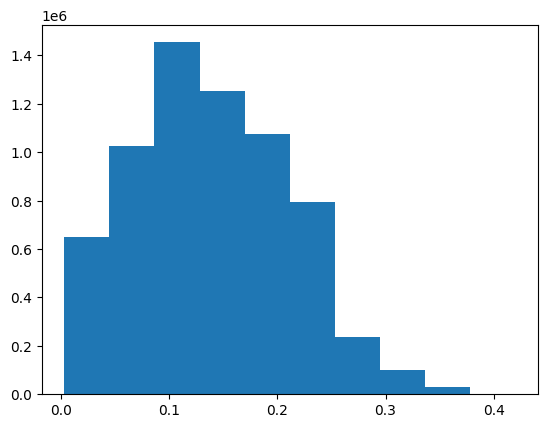

In [72]:
plt.hist(dir_i[:, 0])

(array([ 3.,  3., 17., 17.,  9.,  8.,  4.,  0.,  2.,  1.]),
 array([-0.061958, -0.045205, -0.028452, -0.0117  ,  0.005053,  0.021806,  0.038559,  0.055311,  0.072064,  0.088817,  0.105569]),
 <BarContainer object of 10 artists>)

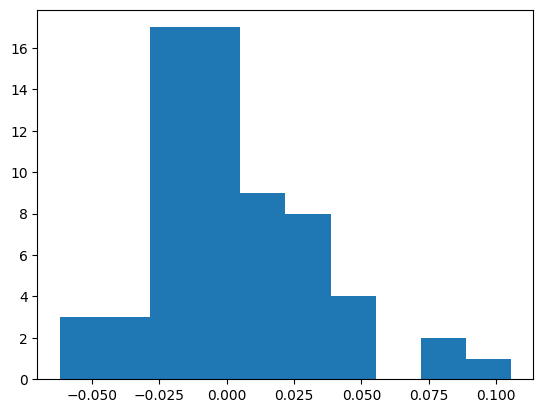

In [75]:
plt.hist(codebook[:, 1])

(array([  65352.,  354134., 2095287., 2707201.,  814721.,  336866.,  153130.,   67300.,   26982.,    1597.]),
 array([-0.077722, -0.055527, -0.033331, -0.011135,  0.01106 ,  0.033256,  0.055451,  0.077647,  0.099842,  0.122038,  0.144233]),
 <BarContainer object of 10 artists>)

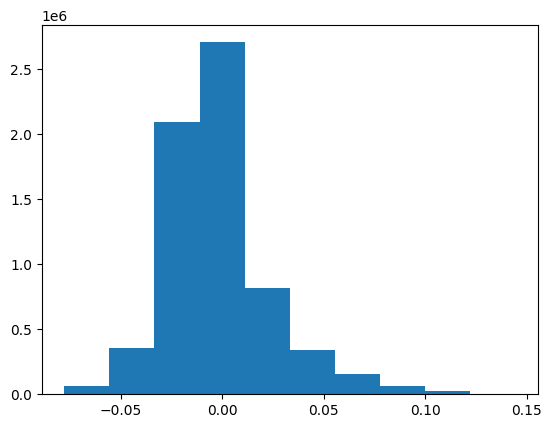

In [52]:
plt.hist(dir_i[:, 1])

In [62]:
kmeans = KMeans(n_clusters=64, random_state=0, n_init='auto')
kmeans.fit(dir_i)

KeyboardInterrupt: 

In [65]:
voxel_model.vox_center.shape

torch.Size([9178272, 3])

In [71]:
codebook, indices, distortion, rate = train_ecvq(dir_i, K=64, lambda_=0.005, max_iter=20)

it=0 Loss:0.02929783663871084
it=1 Loss:0.01733659076333902
it=2 Loss:0.01268426513534918
it=3 Loss:0.011069691401938992
it=4 Loss:0.010172676579926855
it=5 Loss:0.009776731522248922
it=6 Loss:0.009685472655418168
it=7 Loss:0.009669419025872018
it=8 Loss:0.009666231762338705
it=9 Loss:0.009664998407438572
it=10 Loss:0.009663841764346096
it=11 Loss:0.009661691576624628
it=12 Loss:0.009655743001565098
it=13 Loss:0.009654260976947176
it=14 Loss:0.009653788589453583
it=15 Loss:0.009653520141583515
it=16 Loss:0.009653321943666023
it=17 Loss:0.00965317221792876
it=18 Loss:0.009653072050488097
it=19 Loss:0.009652986598895526


(array([12.,  6.,  8., 10.,  7.,  6., 10.,  3.,  1.,  1.]),
 array([0.031467, 0.062695, 0.093923, 0.125152, 0.15638 , 0.187608, 0.218836, 0.250064, 0.281292, 0.312521, 0.343749]),
 <BarContainer object of 10 artists>)

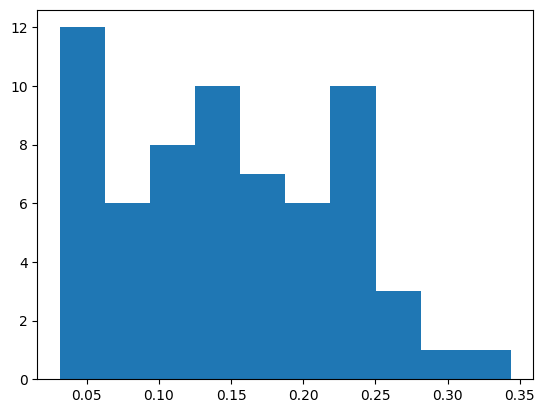

In [73]:
plt.hist(codebook[:, 0])

In [1]:
import numpy as np

In [ ]:
color_transform = np.load("/home/dotamthuc/Works/Projects/Compress3DGS/Experiments/output/SVRasterCompressed-DirColorv2/mip-nerf-360/bicycle/directional_color_transform_precomputed.npz")



In [10]:
directional_color_transform = color_transform["directional_color_transform"]
directional_color_transform_inverse = color_transform["directional_color_transform_inverse"]

In [8]:
directional_color_transform[:10, :10]

array([[ 0.697667, -0.438209,  0.103086, -0.07699 ,  0.003731,  0.160949,  0.178069, -0.014144,  0.329074, -0.234965],
       [-0.438209,  0.739169,  0.144181,  0.008378, -0.036988, -0.168757,  0.074561,  0.013219,  0.079819,  0.308298],
       [ 0.103086,  0.144181,  0.789898, -0.01818 ,  0.019327, -0.44682 ,  0.196055, -0.065185,  0.125201, -0.012381],
       [-0.07699 ,  0.008378, -0.01818 ,  0.79531 , -0.489091,  0.019287,  0.021184,  0.130962, -0.08759 ,  0.00451 ],
       [ 0.003731, -0.036988,  0.019327, -0.489091,  0.843142, -0.04686 ,  0.015074,  0.068299,  0.008538, -0.064605],
       [ 0.160949, -0.168757, -0.44682 ,  0.019287, -0.04686 ,  0.823888,  0.036692,  0.021183, -0.103464,  0.059522],
       [ 0.178069,  0.074561,  0.196055,  0.021184,  0.015074,  0.036692,  0.854578,  0.022669, -0.164641,  0.152737],
       [-0.014144,  0.013219, -0.065185,  0.130962,  0.068299,  0.021183,  0.022669,  0.873132, -0.013291,  0.025247],
       [ 0.329074,  0.079819,  0.125201, -0.0875

In [9]:
directional_color_transform[16:16+10, 16:16+10]

array([[ 0.697667, -0.438209,  0.103086, -0.07699 ,  0.003731,  0.160949,  0.178069, -0.014144,  0.329074, -0.234965],
       [-0.438209,  0.739169,  0.144181,  0.008378, -0.036988, -0.168757,  0.074561,  0.013219,  0.079819,  0.308298],
       [ 0.103086,  0.144181,  0.789898, -0.01818 ,  0.019327, -0.44682 ,  0.196055, -0.065185,  0.125201, -0.012381],
       [-0.07699 ,  0.008378, -0.01818 ,  0.79531 , -0.489091,  0.019287,  0.021184,  0.130962, -0.08759 ,  0.00451 ],
       [ 0.003731, -0.036988,  0.019327, -0.489091,  0.843142, -0.04686 ,  0.015074,  0.068299,  0.008538, -0.064605],
       [ 0.160949, -0.168757, -0.44682 ,  0.019287, -0.04686 ,  0.823888,  0.036692,  0.021183, -0.103464,  0.059522],
       [ 0.178069,  0.074561,  0.196055,  0.021184,  0.015074,  0.036692,  0.854578,  0.022669, -0.164641,  0.152737],
       [-0.014144,  0.013219, -0.065185,  0.130962,  0.068299,  0.021183,  0.022669,  0.873132, -0.013291,  0.025247],
       [ 0.329074,  0.079819,  0.125201, -0.0875

In [11]:
directional_color_transform @ directional_color_transform_inverse

array([[ 1., -0.,  0., -0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., -0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  1., -0., -0.,  0., -0., -0., -0., -0., -0., -0., -0.,  0., -0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  1., -0.,  0., -0., -0., -0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0., -0.,  1.,  0., -0., -0.,  0.,  0.,  0., -0.,  0.,  0., -0., -0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
    

In [68]:
import numpy as np

def train_ecvq(
    points: np.ndarray,
    K: int,
    lambda_: float,
    max_iter: int = 100,
    tol: float = 1e-6,
    seed: int = 0,
) -> tuple[np.ndarray, np.ndarray, float, float]:
    """
    Entropy-Constrained Vector Quantization (ECVQ).

    Minimizes the Lagrangian J = D + λ R,
    where D is average MSE and R is the entropy of the index distribution.

    Parameters
    ----------
    points : (N, 3) float array
        Training vectors.
    K : int
        Maximum codebook size.
    lambda_ : float
        Lagrange multiplier (controls the rate-distortion trade-off).
        Larger λ → lower rate, higher distortion.
    max_iter : int
        Maximum number of iterations.
    tol : float
        Relative change in Lagrangian for early stopping.
    seed : int
        Random seed for initialization.

    Returns
    -------
    codebook : (K, 3) float array
        Learned codebook.
    indices : (N,) int array
        Final assignments.
    distortion : float
        Final average MSE (D).
    rate : float
        Final empirical entropy in bits (R).
    """
    rng = np.random.default_rng(seed)
    N, D = points.shape
    assert D == 3

    # --- Initialization ---
    codebook = points[rng.choice(N, size=K, replace=False)].copy()
    # Start with uniform probabilities
    log_probs = -np.log2(np.full(K, 1.0 / K))

    prev_J = np.inf

    for it in range(max_iter):
        # --- Assignment step (Lagrangian distance) ---
        # Squared Euclidean distances (N, K)
        points_sq = np.sum(points ** 2, axis=1, keepdims=True)
        cb_sq = np.sum(codebook ** 2, axis=1)
        dist = points_sq + cb_sq - 2.0 * points @ codebook.T

        # Add rate penalty: d(x, c_k) + λ * (-log2 p_k)
        dist = dist + lambda_ * log_probs[None, :]

        indices = np.argmin(dist, axis=1)

        # --- Compute current D and R ---
        quantized = codebook[indices]
        distortion = np.mean(np.sum((points - quantized) ** 2, axis=1))

        counts = np.bincount(indices, minlength=K).astype(np.float64)
        probs = counts / N
        # Entropy (only over used codewords)
        used = probs > 0
        rate = -np.sum(probs[used] * np.log2(probs[used]))

        J = distortion + lambda_ * rate
        print(f"it={it} Loss:{J}")
        # --- Convergence check ---
        if (it > 1) and (abs(prev_J - J) / (abs(prev_J) + 1e-12) < tol):
            break
        prev_J = J
        

        # --- Update codebook (centroids) ---
        new_codebook = np.zeros_like(codebook)
        for k in range(K):
            if counts[k] > 0:
                new_codebook[k] = points[indices == k].mean(axis=0)
            else:
                # Re-initialize empty codeword
                new_codebook[k] = points[rng.integers(N)]

        codebook = new_codebook

        # --- Update probabilities (and log-probs) ---
        # Add a small floor to avoid log(0)
        probs = np.maximum(probs, 1e-10)
        probs /= probs.sum()          # renormalize
        log_probs = -np.log2(probs)

    return codebook, indices, distortion, rate

# 03 TEST SH coding

In [ ]:

root_path=f"/home/dotamthuc/Works/Projects/Compress3DGS/Experiments"
path_dataset=f"f{root_path}/data/mip-nerf-360"
path_output_base=f"{root_path}/output/SVRaster/mip-nerf-360"
scene_list = [
    "bicycle",
    "bonsai",
    "counter",
    "flowers",
    "garden",
    "kitchen",
    "room",
    "stump",
    "treehill",
]

path_source=f"{path_dataset}/{scene_list[0]}"
path_output=f"{path_output_base}/{scene_list[0]}"

In [ ]:
import argparse
parser = argparse.ArgumentParser(
    description="Sparse voxels raster rendering.")
parser.add_argument('model_path')
args = parser.parse_args(args=[f"{path_output}"])
update_config(os.path.join(args.model_path, 'config.yaml'))


In [ ]:
# Load data
data_pack = DataPack(
    source_path=cfg.data.source_path,
    image_dir_name=cfg.data.image_dir_name,
    res_downscale=cfg.data.res_downscale,
    res_width=cfg.data.res_width,
    skip_blend_alpha=cfg.data.skip_blend_alpha,
    alpha_is_white=cfg.model.white_background,
    data_device=cfg.data.data_device,
    use_test=cfg.data.eval,
    test_every=cfg.data.test_every,
    camera_params_only=False,
)

# Load model
voxel_model = SparseVoxelModel(
    n_samp_per_vox=cfg.model.n_samp_per_vox,
    sh_degree=cfg.model.sh_degree,
    ss=cfg.model.ss,
    white_background=cfg.model.white_background,
    black_background=cfg.model.black_background,
)

Read dataset in COLMAP format.
Read dataset in 9.156 seconds.


In [ ]:
meta_infos = np.load("Temp/meta_infos.npz")
active_sh_degree = meta_infos["active_sh_degree"]
scene_center = torch.tensor(meta_infos["scene_center"]).cuda()
inside_extent = torch.tensor(meta_infos["inside_extent"]).cuda()
scene_extent = torch.tensor(meta_infos["scene_extent"]).cuda()

In [ ]:
bitstreams = np.load("Temp/occupacy_bitstreams.npz")["bitstreams"]
decoded_octpath, decoded_octlevel = decode_from_stream(bitstreams, max_level=16)
decoded_octpath = torch.tensor(decoded_octpath[:, np.newaxis], dtype=torch.int64).cuda()
decoded_octlevel = torch.tensor(decoded_octlevel[:, np.newaxis], dtype=torch.int8).cuda()


In [ ]:
num_voxels = decoded_octpath.shape[0]
num_voxels

9178272

In [ ]:
vox_center, vox_size = octree_utils.octpath_decoding(
    decoded_octpath,
    decoded_octlevel,
    scene_center,
    scene_extent
)
grid_pts_key, vox_key = octree_utils.build_grid_pts_link(
    decoded_octpath, 
    decoded_octlevel
)

max_levels = torch.ones((grid_pts_key.shape[0], 1), dtype=torch.int8)*16
spanned_mortoncode = svraster_cuda.utils.ijk_2_octpath(grid_pts_key, max_levels)
N = spanned_mortoncode.shape[0]

In [ ]:
spanned_mortoncode = spanned_mortoncode[:, 0].cpu().numpy()

index2origin  = np.arange(spanned_mortoncode.shape[0]).astype(np.int32)
corners_order = np.argsort(spanned_mortoncode)

index2origin       = index2origin[corners_order]
spanned_mortoncode = spanned_mortoncode[corners_order]
num_corners = spanned_mortoncode.shape[0]

In [ ]:

binlevel, coeff_binlevel = raht.RahtPrologue(spanned_mortoncode)
order_coefs = np.argsort(coeff_binlevel)
index_reverse = np.arange(coeff_binlevel.shape[0]).astype(np.int32)
index_reverse = index_reverse[order_coefs]

In [ ]:
temp = np.load("Temp/geoparams_bitstreams.npz")
DC_coef=temp["DC_coef"]
geoparams_bitstreams=temp["geoparams_bitstreams"]

In [ ]:
entropy_model = constriction.stream.model.QuantizedLaplace(-10000, 10000, 0, 5)
decoder = constriction.stream.stack.AnsCoder(geoparams_bitstreams)
decoded_AC_coefs = decoder.decode(entropy_model, num_corners-1)  # decode exactly N symbols


In [ ]:
decoded_transformed_attributes = np.concatenate([DC_coef, decoded_AC_coefs[:, np.newaxis]])
stepsize = 0.5

decoded_temp = np.zeros_like(decoded_transformed_attributes)
decoded_temp[index_reverse] = decoded_transformed_attributes * stepsize
decoded_attributes_ordered = raht.InvRaht(binlevel, decoded_temp)

decoded_attributes = np.zeros_like(decoded_attributes_ordered)
decoded_attributes[index2origin] = decoded_attributes_ordered
decoded_geo_grid_params = decoded_attributes

In [ ]:
decoded_octpath_numpy = decoded_octpath.cpu().numpy()
shs_binlevel, shs_coeff_binlevel = raht.RahtPrologue(decoded_octpath_numpy[:, 0])
order_shs_coefs = np.argsort(shs_coeff_binlevel)
shs_index_reverse = np.arange(index_reverse.shape[0]).astype(np.int32)
shs_index_reverse = shs_index_reverse[order_shs_coefs]

In [ ]:
temp = np.load("Temp/color_bitsteams.npz")
shs_coefficients = np.concatenate([temp["sh0"][:, np.newaxis, :], temp["shs"]], axis=1).reshape(-1, 16, 3)

In [ ]:
shs_coefficients[:, :, 0].shape

(9178272, 16)

In [ ]:
kernels_klt_transform = []
for d in range(3):
    XtX = shs_coefficients[:, :, d].T @ shs_coefficients[:, :, d]
    U, S, V = np.linalg.svd(XtX)
    kernels_klt_transform.append(U)
kernels_klt_transform = np.stack(kernels_klt_transform, axis=0)
kernels_klt_transform.shape

(3, 16, 16)

In [ ]:
shs_coefficients_transformed = np.stack([
    shs_coefficients[:, :, d] @ kernels_klt_transform[d]
    for d in range(3)
], axis=-1)
shs_coefficients_transformed.shape

(9178272, 16, 3)

In [ ]:
XtX = shs_coefficients.reshape(-1, 48).T @ shs_coefficients.reshape(-1, 48)
U, S, V = np.linalg.svd(XtX)
kernels_klt_transform = U

In [ ]:
shs_coefficients_transformed_v2 = (shs_coefficients.reshape(-1, 48) @ kernels_klt_transform).reshape(-1, 16, 3)

In [ ]:
DC_color_coeffs  = []
AC_bitstreams    = []
trasformed_means = []
trasformed_stds  = []
color_coefs_stepsize = 0.5
size = 0.0

for k in range(16):
    coefs = raht.Raht(shs_binlevel, shs_coefficients_transformed_v2[:, k, :])[order_shs_coefs]
    DC_color_coeffs.append(coefs[:8, :].flatten().astype(np.float32))

    trasformed_means.append(
        np.mean(coefs[8:, :].transpose().flatten(), axis=0).astype(np.float32)
    )
    trasformed_stds.append(
        np.std(coefs[8:, :].transpose().flatten(), axis=0).astype(np.float32)
    )

    AC_coefs_quantized = np.round(
        coefs[8:, :].transpose().flatten() / color_coefs_stepsize
    ).astype(np.int32)

    print(f"min_bin={np.min(AC_coefs_quantized)} max_bin={np.max(AC_coefs_quantized)}")
    color_entropy_model = constriction.stream.model.QuantizedGaussian(
        -2000,
        2000,
        trasformed_means[k],
        trasformed_stds[k]
    )

    encoder = constriction.stream.stack.AnsCoder()
    encoder.encode_reverse(AC_coefs_quantized, color_entropy_model)
    AC_bitstream_k = encoder.get_compressed()

    print(
        f"Compressed AC color k={k} coefficients size: "
        f"({len(AC_bitstream_k) * 32/1024/1024/8} Mb including padding)"
    )
    size += len(AC_bitstream_k) * 32/1024/1024/8

    decoder = constriction.stream.stack.AnsCoder(AC_bitstream_k)
    decoded_AC_coefs_quantized = decoder.decode(color_entropy_model, (num_voxels-8) * 3)  # decode exactly N symbols
    assert np.all(decoded_AC_coefs_quantized == AC_coefs_quantized)

    AC_bitstreams.append(AC_bitstream_k)
    

min_bin=-1127 max_bin=1060
Compressed AC color k=0 coefficients size: (9.61846923828125 Mb including padding)
min_bin=-185 max_bin=94
Compressed AC color k=1 coefficients size: (2.4415550231933594 Mb including padding)
min_bin=-96 max_bin=81
Compressed AC color k=2 coefficients size: (2.1385421752929688 Mb including padding)
min_bin=-88 max_bin=65
Compressed AC color k=3 coefficients size: (2.0864410400390625 Mb including padding)
min_bin=-51 max_bin=68
Compressed AC color k=4 coefficients size: (1.9594078063964844 Mb including padding)
min_bin=-41 max_bin=68
Compressed AC color k=5 coefficients size: (1.3318977355957031 Mb including padding)
min_bin=-20 max_bin=29
Compressed AC color k=6 coefficients size: (0.23178482055664062 Mb including padding)
min_bin=-37 max_bin=23
Compressed AC color k=7 coefficients size: (0.15283584594726562 Mb including padding)
min_bin=-20 max_bin=19
Compressed AC color k=8 coefficients size: (0.09183883666992188 Mb including padding)
min_bin=-19 max_bin=16

In [ ]:
size

20.206806182861328

In [ ]:


np.savez_compressed("Temp/color_params_encodes_bitsteams.npz", **{
    "DC_color_coeffs": np.stack(DC_color_coeffs, axis=0),
    "trasformed_means": np.array(trasformed_means).astype(np.float32),
    "trasformed_stds": np.array(trasformed_stds).astype(np.float32),
    "AC_bitstream_0": AC_bitstreams[0],
    "AC_bitstream_1": AC_bitstreams[1],
    "AC_bitstream_2": AC_bitstreams[2],
    "AC_bitstream_3": AC_bitstreams[3],
    "AC_bitstream_4": AC_bitstreams[4],
    "AC_bitstream_5": AC_bitstreams[5],
    "AC_bitstream_6": AC_bitstreams[6],
    "AC_bitstream_7": AC_bitstreams[7],
    "AC_bitstream_8": AC_bitstreams[8],
    "AC_bitstream_9": AC_bitstreams[9],
    "AC_bitstream_10": AC_bitstreams[10],
    "AC_bitstream_11": AC_bitstreams[11],
    "AC_bitstream_12": AC_bitstreams[12],
    "AC_bitstream_13": AC_bitstreams[13],
    "AC_bitstream_14": AC_bitstreams[14],
    "AC_bitstream_15": AC_bitstreams[15],
})

In [ ]:
DC_color_coeffs  = np.stack(DC_color_coeffs, axis=0)
trasformed_means = np.array(trasformed_means).astype(np.float32)
trasformed_stds  = np.array(trasformed_stds).astype(np.float32)

In [ ]:
decoded_shs_coefficients_transformed = []
for k in range(16):
    color_entropy_model = constriction.stream.model.QuantizedGaussian(
        -2000,
        2000,
        trasformed_means[k],
        trasformed_stds[k]
    )

    AC_bitstream_k = AC_bitstreams[k]
    decoder = constriction.stream.stack.AnsCoder(AC_bitstream_k)
    decoded_AC_coefs_quantized = decoder.decode(color_entropy_model, (num_voxels-8) * 3)  # decode exactly N symbols
    decoded_AC_coefs_quantized = decoded_AC_coefs_quantized * color_coefs_stepsize

    decoded_coefs_ordered = np.concatenate([
        DC_color_coeffs[k].reshape(8, 3),
        decoded_AC_coefs_quantized.reshape(3, (num_voxels-8)).transpose(),
    ], axis=0)

    decoded_coefs = np.zeros_like(decoded_coefs_ordered)
    decoded_coefs[shs_index_reverse] = decoded_coefs_ordered
    decoded_shs_coefficients_k = raht.InvRaht(shs_binlevel, decoded_coefs)

    decoded_shs_coefficients_transformed.append(decoded_shs_coefficients_k)

In [ ]:
decoded_shs_coefficients_transformed = np.stack(
    decoded_shs_coefficients_transformed,
    axis=1
)

In [ ]:
# decoded_shs_coefficients = np.stack([
#     decoded_shs_coefficients_transformed[:, :, d] @ kernels_klt_transform[d].T
#     for d in range(3)
# ], axis=-1)
# decoded_shs_coefficients.shape
decoded_shs_coefficients = (decoded_shs_coefficients_transformed.reshape(-1, 48) @ kernels_klt_transform.T).reshape(-1, 16, 3)

In [ ]:
decoded_shs_coefficients[:10, 0, :]

array([[-1.146066, -0.975341, -0.692254],
       [ 1.387634,  1.213192,  1.118385],
       [-2.840967, -2.371578, -2.760934],
       [ 1.513457,  1.192601,  1.274692],
       [ 1.471509,  1.103346,  2.269455],
       [ 2.080565,  2.112665,  2.533093],
       [ 0.409466, -0.222804,  0.243305],
       [ 0.704971,  0.509863,  0.395268],
       [ 1.054943,  0.79701 ,  0.938148],
       [ 1.980817,  1.168108,  0.716347]])

In [ ]:
shs_coefficients[:10, 0, :]

array([[-1.106353, -1.024465, -0.892495],
       [ 1.335587,  1.191857,  1.341734],
       [-2.676602, -2.437515, -2.957579],
       [ 1.337768,  1.287304,  1.153481],
       [ 1.592348,  1.471181,  2.109152],
       [ 2.257876,  2.273835,  2.471614],
       [ 0.472588, -0.063842,  0.200984],
       [ 0.493239,  0.642506,  0.350202],
       [ 0.941773,  0.779138,  0.632314],
       [ 1.786427,  1.213976,  0.669791]], dtype=float32)

In [ ]:

# Load model
voxel_model = SparseVoxelModel(
    n_samp_per_vox=cfg.model.n_samp_per_vox,
    sh_degree=cfg.model.sh_degree,
    ss=cfg.model.ss,
    white_background=cfg.model.white_background,
    black_background=cfg.model.black_background,
)


voxel_model.active_sh_degree = active_sh_degree
voxel_model.scene_center     = scene_center
voxel_model.inside_extent    = inside_extent
voxel_model.scene_extent     = scene_extent

voxel_model.octpath  = decoded_octpath
voxel_model.octlevel = decoded_octlevel

voxel_model._geo_grid_pts = torch.tensor(decoded_geo_grid_params).cuda().to(torch.float32)
voxel_model._sh0          = torch.tensor(decoded_shs_coefficients[:, 0, :]).cuda().to(torch.float32)
voxel_model._shs          = torch.tensor(decoded_shs_coefficients[:, 1:]).cuda().to(torch.float32)


tr_render_opt = {
    'track_max_w': False,
    'output_depth': False,
    'output_normal': False,
    'output_T': False,
}
psnr_lst = []
views = data_pack.get_test_cameras()
for idx, view in enumerate(views):
    render_pkg = voxel_model.render(view, **tr_render_opt)
    rendering = render_pkg['color']
    gt = view.image.cuda()
    mse = (rendering.clip(0,1) - gt.clip(0,1)).square().mean()
    psnr = -10 * torch.log10(mse)
    psnr_lst.append(psnr.item())
print('PSNR:', np.mean(psnr_lst))

PSNR: 24.269460678100586


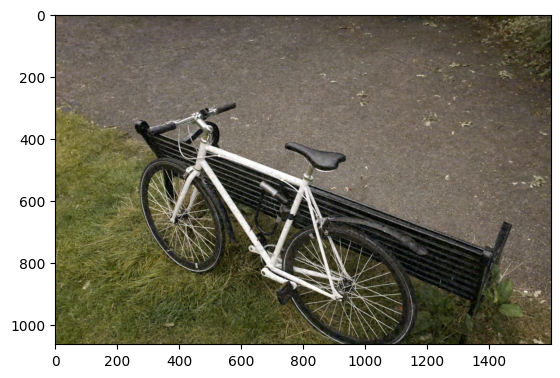

In [ ]:
plt.imshow(im_tensor2np(rendering.detach()))

In [ ]:
voxel_model.decode(path="/home/dotamthuc/Works/Projects/Compress3DGS/Experiments/output/SVRaster/mip-nerf-360/bicycle/compressed_bitstream/config00")

In [ ]:

tr_render_opt = {
    'track_max_w': False,
    'output_depth': False,
    'output_normal': False,
    'output_T': False,
}
psnr_lst = []
views = data_pack.get_test_cameras()
for idx, view in enumerate(views):
    render_pkg = voxel_model.render(view, **tr_render_opt)
    rendering = render_pkg['color']
    gt = view.image.cuda()
    mse = (rendering.clip(0,1) - gt.clip(0,1)).square().mean()
    psnr = -10 * torch.log10(mse)
    psnr_lst.append(psnr.item())
print('PSNR:', np.mean(psnr_lst))

PSNR: 25.21588409423828


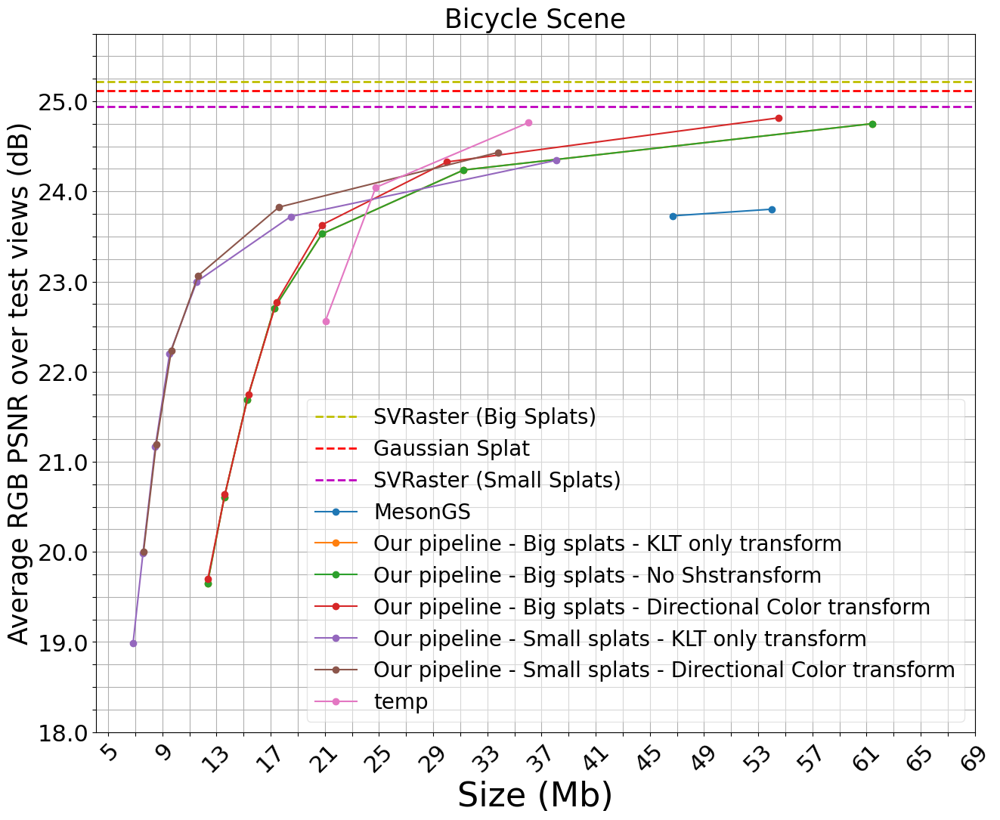

In [1]:
import matplotlib.pylab as plt 
import numpy as np

fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(15, 12))


## BASELINE 
ax.axhline(y=25.2211, color="y", linestyle='--', linewidth=2, label="SVRaster (Big Splats)")
ax.axhline(y=25.1179, color="r", linestyle='--', linewidth=2, label="Gaussian Splat") 
ax.axhline(y=24.9419, color="m", linestyle='--', linewidth=2, label="SVRaster (Small Splats)")

list_mb=[46.70477, 54.0196]
list_psnr=[23.7293, 23.8028]
ax.plot(list_mb, list_psnr, '-o', label="MesonGS")


list_mb=[61.451, 31.246, 20.789, 17.247, 15.248, 13.570, 12.333, ]
list_psnr=[24.7524, 24.237835845947266, 23.529027633666992, 22.699968338012695, 21.683812103271485, 20.60430473327637, 19.65097869873047]
ax.plot(list_mb, list_psnr, '-o', label="Our pipeline - Big splats - KLT only transform")



list_mb=[61.451, 31.246, 20.789, 17.247, 15.248, 13.570, 12.333, ]
list_psnr=[24.7524, 24.237835845947266, 23.529027633666992, 22.699968338012695, 21.683812103271485, 20.60430473327637, 19.65097869873047]
ax.plot(list_mb, list_psnr, '-o', label="Our pipeline - Big splats - No Shstransform")

list_mb=[54.494, 30.024, 20.781, 17.420, 15.360, 13.614, 12.356]
list_psnr=[24.8163, 24.3275, 23.6285, 22.7704, 21.7457, 20.6360, 19.6984]
ax.plot(list_mb, list_psnr, '-o', label="Our pipeline - Big splats - Directional Color transform")

list_mb=[38.121, 18.480, 11.542, 9.530, 8.472, 7.569, 6.836]
list_psnr=[24.34614, 23.7213, 22.9994, 22.1960, 21.1640, 19.9883, 18.9902]
ax.plot(list_mb, list_psnr, '-o', label="Our pipeline - Small splats - KLT only transform")


list_mb=[33.819, 17.608, 11.640, 9.663, 8.535, 7.605]
list_psnr=[24.4338, 23.8257, 23.0643, 22.2368, 21.1888, 19.9996]
ax.plot(list_mb, list_psnr, '-o', label="Our pipeline - Small splats - Directional Color transform")





list_mb=[36.006405,24.760046,21.042693]
list_psnr=[24.761619,24.044488,22.563487]
ax.plot(list_mb, list_psnr, '-o', label="temp")

############ 
yticks = np.arange(18, 26, step=0.25)
plt.yticks(ticks=yticks, labels=["{:.1f}".format(x) if i%4==0 else "" for i, x in enumerate(yticks)], fontsize=22)

xticks = np.arange(5, 70, step=2)
plt.xticks(ticks=xticks, labels=["{:2d}".format(x) if i%2==0 else "" for i, x in enumerate(xticks)], rotation=45, fontsize=22)
plt.grid()
plt.legend(fancybox=True, framealpha=0.5, prop={'size': 20})
plt.xlabel('Size (Mb)', fontsize=32)
plt.ylabel('Average RGB PSNR over test views (dB)', fontsize=25)
plt.title('Bicycle Scene', fontsize=25)
plt.show()